## Computational Statistique TP1:

#### Samuel Bazaz Jazayeri

### Exercise 3 : Stochastic Gradient Learning in Neural Networks

### 1+2:

In [297]:
############
# Packages #
############

import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from typing import Tuple


###################
# hyperparametres #
###################

# data creation
seed = 0
n = 100
d = 2
true_w = np.array([1, -2])
true_tau = 1

# stochastic gradient descent
lr = 0.1
n_iter = 10000
batch = 1

# Normal pertubations
mu = 0.2
sigma = 1

# More perturbation analysis

# True data test

data_path = "C://Users//samud//Bureau//Python code//MVA//Comput stat//TP1//data//breast-cancer-wisconsin.data"
lr2 = 0.05
n_iter2 = 100000


In [287]:
#############
# functions #
#############


def get_labels(mat_x: np.ndarray, w: np.ndarray, tau: float) -> np.ndarray:
    """
    Calcule les étiquettes en utilisant un modèle linéaire.

    Cette fonction prend en entrée une matrice de caractéristiques mat_x, un vecteur de poids w
    et un seuil tau. Elle retourne un vecteur d'étiquettes en utilisant le modèle linéaire
    défini par l'équation : y = mat_x.dot(w) + tau. Les étiquettes sont définies comme suit :
    - Si y est inférieur à 0, l'étiquette est -1.
    - Sinon, l'étiquette est 1.

    Args:
        mat_x (np.ndarray): La matrice de caractéristiques de shape (n_samples, n_features).
        w (np.ndarray): Le vecteur de poids du modèle de shape (n_features,).
        tau (float): Le seuil.

    Returns:
        np.ndarray: Un vecteur d'étiquettes de shape (n_samples,).
    """
    vec_y = mat_x.dot(w) + tau
    vec_y[vec_y < 0] = -1
    vec_y[vec_y >= 0] = 1
    return vec_y


def get_accuracy(vec_y: np.ndarray, true_y: np.ndarray) -> float:
    """
    Calcule la précision d'un modèle de classification binaire.

    Cette fonction prend en entrée un vecteur d'étiquettes prédites vec_y et un vecteur d'étiquettes
    réelles true_y. Elle compare ces deux vecteurs et calcule la précision du modèle de classification
    binaire. La précision est définie comme le nombre d'étiquettes correctement prédites divisé par
    le nombre total d'échantillons.

    Args:
        vec_y (np.ndarray): Le vecteur d'étiquettes prédites de shape (n_samples,).
        true_y (np.ndarray): Le vecteur d'étiquettes réelles de shape (n_samples,).

    Returns:
        float: La précision du modèle, une valeur entre 0 et 1.
    """
    return np.mean(vec_y == true_y)


def reg_line_from_parameters(
    vec_x1: np.ndarray, w: np.ndarray, tau: float
) -> np.ndarray:
    """
    Cette fonction prend en entrée un vecteur vec_x1 de valeurs de l'axe des x1, un vecteur w de
    paramètres de régression, et un paramètre de décalage tau. Elle calcule et retourne un vecteur
    de valeurs représentant l'équation d'une droite .

    Args:
        vec_x1 (np.ndarray): Le vecteur des valeurs de l'axe des x1 de shape (n_samples,).
        w (np.ndarray): Le vecteur de paramètres de régression de shape (2,).
        tau (float): Le paramètre de décalage.

    Returns:
        np.ndarray: Le vecteur de valeurs de la droite régularisée de shape (n_samples,).
    """
    return (-1 / w[1]) * (w[0] * vec_x1 + tau)


def add_reg_line(
    fig: go.Figure,
    vec_x1: np.ndarray,
    w: np.ndarray,
    tau: float,
    name: str = "classification",
    color: str = "gray",
) -> go.Figure:
    """
    Ajoute une ligne de régression à un objet figure Plotly.

    Cette fonction prend en entrée un objet figure Plotly (fig), un vecteur de valeurs vec_x1
    pour l'axe des x1, un vecteur w de paramètres de régression, un paramètre de décalage tau,
    un nom pour la ligne de régression (name) et une couleur pour la ligne (color). Elle calcule
    la ligne de régression à partir de vec_x1, w et tau, puis l'ajoute à l'objet figure.

    Args:
        fig (go.Figure): L'objet figure Plotly auquel ajouter la ligne de régression.
        vec_x1 (np.ndarray): Le vecteur des valeurs de l'axe des x1 de shape (n_samples,).
        w (np.ndarray): Le vecteur de paramètres de régression de shape (2,).
        tau (float): Le paramètre de décalage.
        name (str, optional): Le nom de la ligne de régression. Par défaut, "classification".
        color (str, optional): La couleur de la ligne de régression. Par défaut, "gray".

    Returns:
        go.Figure: L'objet figure Plotly avec la ligne de régression ajoutée.
    """
    reg = reg_line_from_parameters(vec_x1, w, tau)
    fig.add_trace(
        go.Scatter(x=vec_x1, y=reg, mode="lines",
                   name=name, marker_color=color)
    )


def split_para(parameters):
    return parameters[0], parameters[1:]


def stochastic_descent_binary_classif(
    mat_x: np.ndarray,
    vec_y: np.ndarray,
    lr: float,
    n_iter: int,
    batch: int,
    seed: int,
    fig: go.Figure = None,
    nfig: int = 10,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Effectue une descente de gradient stochastique pour la classification binaire.

    Cette fonction prend en entrée les données mat_x, les étiquettes vec_y, le taux d'apprentissage lr,
    le nombre d'itérations n_iter, la taille du lot (batch), une graine (seed) pour la génération aléatoire,
    et une figure optionnelle pour la visualisation de la progression. Elle renvoie les paramètres optimaux
    de la régression (tau et w).

    Args:
        mat_x (np.ndarray): Les données d'entraînement de forme (n, d), où n est le nombre d'échantillons
                           et d est le nombre de caractéristiques.
        vec_y (np.ndarray): Les étiquettes de classification de forme (n, 1).
        lr (float): Le taux d'apprentissage.
        n_iter (int): Le nombre d'itérations de la descente de gradient.
        batch (int): La taille du lot (nombre d'échantillons tirés à chaque étape de mise à jour).
        seed (int): La graine pour la génération aléatoire.
        fig (go.Figure, optional): Une figure Plotly pour visualiser la progression (par défaut, None).
        nfig (int, optional): Le nombre de figures à afficher pour la visualisation (par défaut, 10).

    Returns:
        Tuple[np.ndarray, np.ndarray]: Un tuple contenant les paramètres optimaux de la régression,
        tau (biais) et w (coefficients).
    """
    np.random.seed(seed)
    n, d = mat_x.shape
    mat_x_with_ones = np.concatenate((np.ones((n, 1)), mat_x), axis=1)
    sample_indexes = np.random.randint(0, n, n_iter * batch)
    parameters = np.random.rand(d + 1, 1)
    fig_period = n_iter // nfig

    def get_sample(step):
        indexes = sample_indexes[step * batch: (step + 1) * batch]
        return (mat_x_with_ones[indexes], vec_y[indexes])

    if fig:
        pal = sns.color_palette("Spectral", n_iter + 1).as_hex()
        tau, w = split_para(parameters)
        add_reg_line(fig, mat_x[:, 0], w, tau, f"step{0}", pal[0])

    for k in range(n_iter):
        (xi, yi) = get_sample(k)

        # Calcul du gradient
        grad = (2 / n) * xi.T.dot(xi.dot(parameters) - yi)
        parameters = parameters - lr * grad  # Mise à jour des paramètres
        if fig and k % fig_period == 0:
            tau, w = split_para(parameters)
            add_reg_line(fig, mat_x[:, 0], w, tau, f"step{k+1}", pal[k + 1])

    return split_para(parameters)


def get_only_accuracy(
    mat_x_train: np.ndarray, mat_x_test: np.ndarray, y_test: np.ndarray
) -> float:
    """
    Calcule la précision d'un modèle de régression sur un ensemble de test.

    Cette fonction prend en entrée les données d'entraînement mat_x_train, les données de test mat_x_test
    et les étiquettes de test y_test. Elle utilise la descente de gradient stochastique pour entraîner un
    modèle de régression logistique sur les données d'entraînement, puis calcule la précision du modèle sur
    les données de test.

    Args:
        mat_x_train (np.ndarray): Les données d'entraînement de forme (n, d), où n est le nombre d'échantillons
                                d'entraînement et d est le nombre de caractéristiques.
        mat_x_test (np.ndarray): Les données de test de forme (m, d), où m est le nombre d'échantillons de test.
        y_test (np.ndarray): Les étiquettes de test de forme (m, 1).

    Returns:
        float: La précision du modèle de régression sur l'ensemble de test.
    """
    tau_, w_ = stochastic_descent_binary_classif(
        mat_x_train, y_test.reshape(n, 1), lr, n_iter, batch, seed, None
    )
    vec_y_ = get_labels(mat_x_test, w_, tau_)
    return get_accuracy(vec_y_, y_test)


In [304]:
#################
# data creation #
#################

np.random.seed(seed)
mat_x = 4 * np.random.rand(n, d) - 2
true_y = get_labels(mat_x, true_w, true_tau)

fig1 = go.Figure()
fig1.add_trace(
    go.Scatter(x=mat_x[:, 0], y=mat_x[:, 1],
               marker_color=true_y, mode="markers")
)
add_reg_line(
    fig1, mat_x[:, 0], true_w, true_tau, name="classification optimal", color="gray"
)
fig1.update_layout(
    title=f"<b>Classification optimale</b> Accuracy={get_accuracy(true_y, true_y)}",
    xaxis_title="<b>Axe x1</b>",
    yaxis_title="<b>Axe x2</b>",
)
fig1.show(renderer='notebook')

In [305]:
###########################
# Stochastic descent test #
###########################

fig2 = go.Figure()
fig2.add_trace(
    go.Scatter(x=mat_x[:, 0], y=mat_x[:, 1], marker_color=true_y, mode="markers")
)
tau, w = stochastic_descent_binary_classif(
    mat_x, true_y.reshape(n, 1), lr, n_iter, batch, seed, fig2
)

vec_y = get_labels(mat_x, w, tau)

add_reg_line(
    fig2, mat_x[:, 0], true_w, true_tau, name="classification optimal", color="gray"
)

fig2.update_layout(
    title=f"<b>Gradient Stochastique</b> Accuracy={get_accuracy(vec_y[:,0], true_y)}",
    xaxis_title="<b>Axe x1</b>",
    yaxis_title="<b>Axe x2</b>",
)
fig2.show(renderer='notebook')

### 3:

In [306]:
###################
# data with noise #
###################

mat_x_perturbed = mat_x + np.random.normal(mu, sigma, size=(n, d))

fig3 = go.Figure()
fig3.add_trace(
    go.Scatter(
        x=mat_x[:, 0],
        y=mat_x[:, 1],
        marker_color=true_y,
        mode="markers",
        name="true data",
    )
)

fig3.add_trace(
    go.Scatter(
        x=mat_x_perturbed[:, 0],
        y=mat_x_perturbed[:, 1],
        marker_color="gray",
        mode="markers",
        name="perturbed data",
    )
)


add_reg_line(
    fig3, mat_x[:, 0], true_w, true_tau, name="classification optimal", color="gray"
)
fig3.update_layout(
    title=f"<b>Classification optimale</b> Accuracy={get_accuracy(true_y, true_y)}",
    xaxis_title="<b>Axe x1</b>",
    yaxis_title="<b>Axe x2</b>",
)
fig3.show(renderer='notebook')

In [307]:
#########################################
# Stochastic descent with perturbations #
#########################################

fig4 = go.Figure()
fig4.add_trace(
    go.Scatter(x=mat_x[:, 0], y=mat_x[:, 1], marker_color=true_y, mode="markers")
)
tau, w = stochastic_descent_binary_classif(
    mat_x_perturbed, true_y.reshape(n, 1), lr, n_iter, batch, seed, fig4
)

vec_y = get_labels(mat_x, w, tau)

add_reg_line(
    fig4, mat_x[:, 0], true_w, true_tau, name="classification optimal", color="gray"
)

fig4.update_layout(
    title=f"<b>SGD with white noise</b> Accuracy={get_accuracy(vec_y[:,0], true_y)}  mu={mu}  sigma={sigma}",
    xaxis_title="<b>Axe x1</b>",
    yaxis_title="<b>Axe x2</b>",
)
fig4.show(renderer='notebook')

Un bruit biaisé semble grandement affecter l'algorithme. Il peut être intéressant d'étudier l'évolution de l'accuracy en fonction du bruit: 

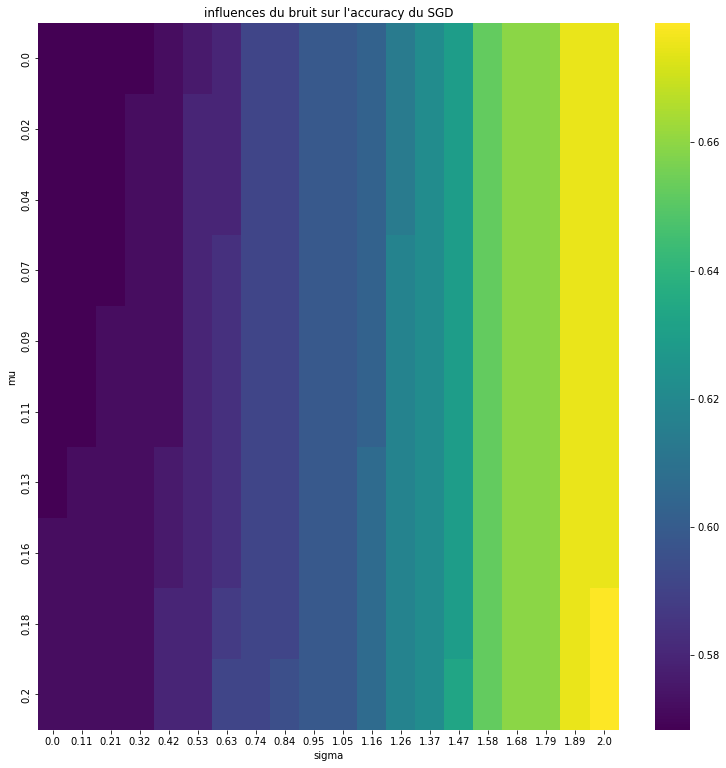

In [292]:
n_mu = 10
n_sig = 20

vec_mu = np.linspace(0, 0.2, n_mu)
vec_sigma = np.linspace(0, 2, n_sig)
mat_accu = np.zeros((n_mu, n_sig))

for i in range(n_mu):
    for j in range(n_sig):
        mat_x_pertij = mat_x + \
            np.random.normal(vec_mu[i], vec_sigma[j], size=(n, d))
        mat_accu[i, j] = get_only_accuracy(mat_x_pertij, mat_x, true_y)

df = pd.DataFrame(mat_accu, columns=vec_sigma, index=vec_mu)

fig = plt.figure(figsize=(13, 13))
plt.title("influences du bruit sur l'accuracy du SGD")
ax = sns.heatmap(mat_accu, cmap="viridis")
ax.set(xlabel="sigma", ylabel="mu")
ax.set_xticklabels(np.round(vec_sigma, 2))
ax.set_yticklabels(np.round(vec_mu, 2))
plt.show()


Etrangement l'augmentation de la variance peut conduire à améliorer la performance de l'algorithme.

### 4: 

In [252]:
######################
#  data exploration  #
######################


df = pd.read_csv(data_path)


def df_nan_percent(df: pd.DataFrame) -> pd.DataFrame:
    """
    Calcule le pourcentage de valeurs manquantes dans chaque colonne d'un DataFrame.

    Args:
        df (pd.DataFrame): DataFrame contenant les données.

    Returns:
        pd.DataFrame: DataFrame contenant le pourcentage de valeurs manquantes pour chaque colonne.
    """
    part_nan = df.isnull().mean()
    perc_nan = pd.DataFrame(100 * part_nan.to_numpy())
    perc_nan.index = part_nan.index
    return perc_nan


print("\n---------Shape------------------\n", df.shape)
print("\n---------Types------------------\n", df.dtypes)
print("\n--------- 1 row-----------------\n", df.iloc[0, :])
print("\n---------describe---------------\n", df.describe())
print("\n---------nan percentage---------\n", df_nan_percent(df))
for col in df:
    unique_val = df[col].unique()
    if len(unique_val) < 20:
        print(f"\n---------{col} values----------")
        print(unique_val)


---------Shape------------------
 (698, 11)

---------Types------------------
 1000025     int64
5           int64
1           int64
1.1         int64
1.2         int64
2           int64
1.3        object
3           int64
1.4         int64
1.5         int64
2.1         int64
dtype: object

--------- 1 row-----------------
 1000025    1002945
5                5
1                4
1.1              4
1.2              5
2                7
1.3             10
3                3
1.4              2
1.5              1
2.1              2
Name: 0, dtype: object

---------describe---------------
             1000025           5           1         1.1         1.2  \
count  6.980000e+02  698.000000  698.000000  698.000000  698.000000   
mean   1.071807e+06    4.416905    3.137536    3.210602    2.809456   
std    6.175323e+05    2.817673    3.052575    2.972867    2.856606   
min    6.163400e+04    1.000000    1.000000    1.000000    1.000000   
25%    8.702582e+05    2.000000    1.000000    1.00

In [275]:
###################
#  Preprocessing  #
###################

# labels standardization
df["2.1"].replace({2: -1, 4: 1}, inplace=True)

# nan and type standardization
df["1.3"].replace({"?": np.nan}, inplace=True)

df["1.3"] = df["1.3"].astype("Int64")

df_nan_percent(df)

,0
5,0.000000
1,0.000000
1.1,0.000000
1.2,0.000000
2,0.000000
1.3,2.292264
3,0.000000
1.4,0.000000
1.5,0.000000
2.1,0.000000


On prend la décision d'éliminer les valeurs vide au vu de leur faibles proportions.

In [276]:
df.dropna(inplace=True)


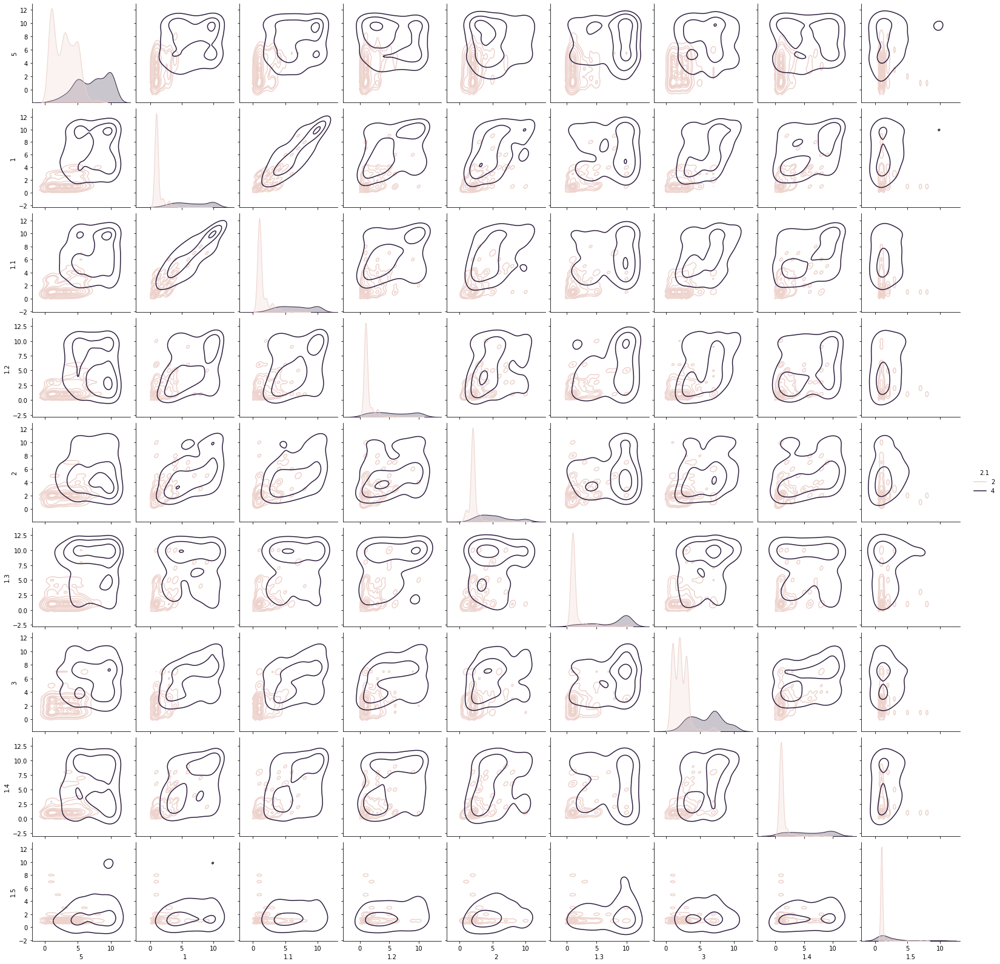

In [258]:
#######################
#  Data Visualization #
#######################

sns.pairplot(df, hue="2.1", kind="kde")


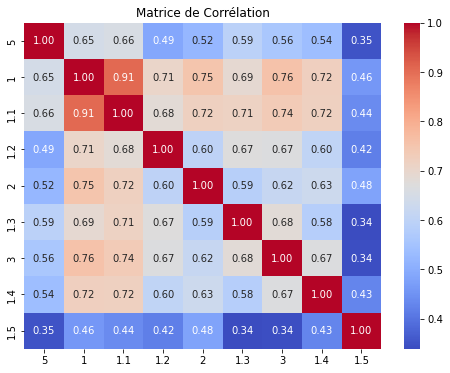

In [266]:
matrice_correlation = df[["5", "1", "1.1", "1.2", "2", "1.3", "3", "1.4", "1.5"]].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(matrice_correlation, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matrice de Corrélation")
plt.show()

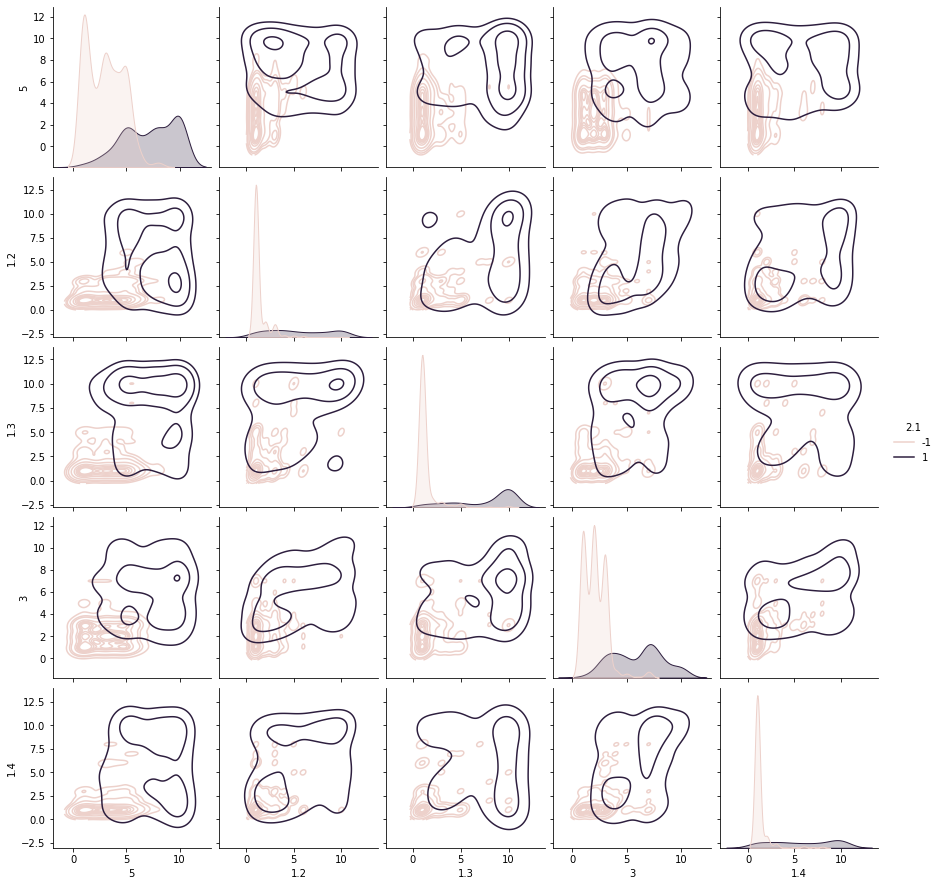

In [278]:
#######################
#  Feature selection  #
#######################

label = "2.1"
lst_feature = ["5", "1.2", "1.3", "3", "1.4"]

mat_x_real = df[lst_feature]
y_real = df[label]

sns.pairplot(df[lst_feature + [label]], hue="2.1", kind="kde")

In [303]:
#########################################
# Stochastic descent with perturbations #
#########################################

mat_x_train, mat_x_test, y_train, y_test = train_test_split(
    mat_x_real, y_real, test_size=0.2, random_state=seed
)


tau, w = stochastic_descent_binary_classif(
    mat_x_train.values, y_train.values, lr2, n_iter2, batch, seed, None
)
pred_train = get_labels(mat_x_train.values, w, tau)
pred_test = get_labels(mat_x_test.values, w, tau)

train_score = get_accuracy(pred_train[:, 0], y_train.values)
test_score = get_accuracy(pred_test[:, 0], y_test.values)

print(f"Train accuracy {train_score} \nTest accuracy {test_score}")

Train accuracy 0.9577981651376147 
Test accuracy 0.9416058394160584


L'accuracy du test est plutôt satisfaisant (95%). Il faudrait cependant étudier l'objectif de la régression afin  d'arbitrer entre erreur de type 1 et 2 par le choix d'une métrique plus adaptée que l'accuracy. 